# Using Tabula Sapiens as a reference for annotating new datasets

In [7]:
import os, sys

#sys.path.insert(0, '../../PopV')
import popv
import anndata
import numpy as np
import scanpy as sc
from scanpy.plotting import palettes
sys.path.insert(-1, '../..')
import _utils

2024-01-04 17:55:00.991859: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-04 17:55:01.025223: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-01-04 17:55:01.565525: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
From /home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/tensorflow/python/compat/v2_compat.py:107: disable_resource_variables (from tensorflow.python.ops.variable_scope) is deprecated and will be removed in a future version.
Instructions for upda

# Step 2: Load your data (User Action Required)
Here we provide three options to load your data:
1. Connect to Google Drive (highly recommended)
2. Download your data from the cloud and save into this session or on Google drive.
3. Upload your data manually into this session (files are not persistent and will be deleted when session is closed)

As an example, we use a subsampled version of the [Lung Cell Atlas](https://hlca.ds.czbiohub.org/) \[1] for our query data.

\[1] Travaglini, K. et al. A molecular cell atlas of the human lung from single-cell RNA sequencing. *Nature* **587**, 619–625(2020).

In [2]:
import pandas as pd

pd.options.display.max_columns = None

# Step 3 (User Action Required): Setting Up Annotation Parameters 

Here is where you set the parameters for the automated annotation.

Arguments:
- **tissue:** Tabula Sapiens tissue to annotate your data with. Available tissues: ["Bladder", "Blood", "Bone_Marrow", "Kidney", "Large_Intestine", "Lung","Lymph_Node", "Pancreas", "Small_Intestine", "Spleen", "Thymus","Trachea", "Vasculature"]
- **save_location:** location to save results to. By default will save to a folder named `annotation_results`. It is highly recommended you provide a Google Drive folder here.
- **query_batch_key:** key in `query_adata.obs` for batch correction. Set to None for no batch correction. 
- **algorithms:** these are the methods to run. By default, will run all methods.
Options: ["knn_on_scvi_pred", "scanvi_pred", "knn_on_bbknn_pred", "svm_pred", "rf_pred", "onclass_pred", "knn_on_scanorama_pred",


Lesser used parameters
- **query_labels_key**: scANVI has the option to use labeled cells in the query dataset during training. To use some prelabeled cells from the query dataset, set `query_labels_key` to the corresponding key in `query_adata.obs`
- **unknown_celltype_label**: If `query_labels_key` is not None, will treat everything not labeled `unknown_celltype_label` as a labeled cell

In [3]:
""" 
tissue options: 
['Bladder','Blood','Bone_Marrow','Fat',
'Heart','Kidney','Large_Intestine','Liver',
'Lung','Lymph_Node','Mammary','Muscle',
'Pancreas','Prostate','Salivary Gland',
'Skin','Small_Intestine','Spleen',
'Thymus','Trachea','Vasculature']
"""
output_folder = 'annotation_subsampled'
tissue = 'Lung'
save_folder = f'{output_folder}/popv_results'

# Lesser used parameters
query_labels_key=None
unknown_celltype_label='unknown'

# Step 4: Downloading Reference Data and Pretrained Models
No more user input required! Just run all the following code blocks.

**NOTE: PopV has only been evaluated with the Lung/Thymus/Lymph_Node as a reference dataset. Different tissues have different annotation quality and the Tabula sapiens community is currently actively improving the annotation quality. We strongly expect improvement of cell annotation when the updated annotation is released. Upon release the Zenodo repository will be updated.**

In [8]:
import requests
res = requests.get("https://zenodo.org/api/records/7587774")
tissue_download_path = {ind['key'][3:-14]:ind['links']['self'] for ind in res.json()['files']}

In [9]:
refdata_url = tissue_download_path[tissue]
output_fn = f'{output_folder}/TS_{tissue}.h5ad'
if not os.path.exists(output_fn):
    !wget -O $output_fn $refdata_url

In [10]:
output_fn = f'{output_folder}/TS_{tissue}.h5ad'
# read in the reference dataset
adata = sc.read_h5ad(output_fn)
# ref_adata = ref_adata[np.random.choice(ref_adata.obs_names, 5000, replace=False)]

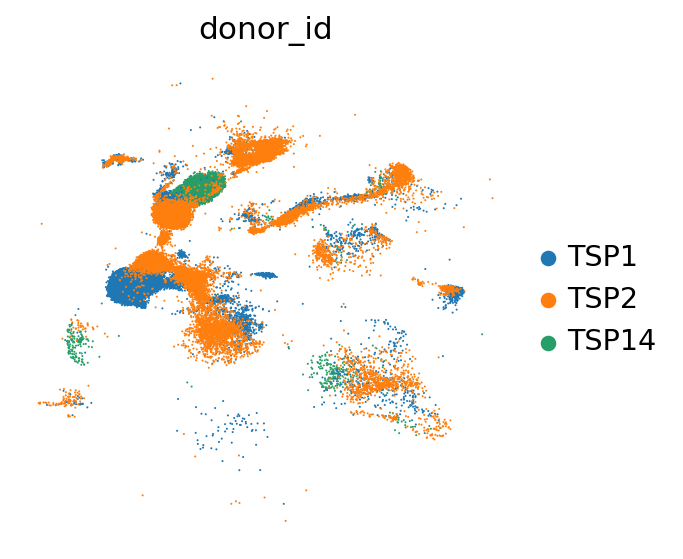

TSP2     18126
TSP1     13196
TSP14     4350
Name: donor_id, dtype: int64

In [11]:
sc.pl.umap(adata, color='donor_id')
adata.obs['donor_id'].value_counts()

In [12]:
adata = adata[adata.obs['assay_correct']=="10x 3' v3"]

In [13]:
adata.obs['cell_ontology_class'] = adata.obs['cell_ontology_class'].astype(str)
adata.obs.loc[adata.obs['free_annotation']=='capillary aerocyte', 'cell_ontology_class'] = 'alveolar capillary type 2 endothelial cell'
adata.obs['cell_ontology_class'] = adata.obs['cell_ontology_class'].astype('category')

In [14]:
indices = np.random.choice(adata.obs_names, 5000, replace=False)
query_adata = adata[indices]
ref_adata = adata[~adata.obs_names.isin(indices)]

### Setup reference data

In [15]:
# Following parameters are specific to Tabula Sapiens dataset and contain the annotated cell-type and the batch_key that are corrected for during model training.
ref_labels_key='cell_ontology_class'
ref_batch_key = query_batch_key = 'donor_assay'

In [16]:
min_celltype_size = np.min(ref_adata.obs.groupby(ref_labels_key).size())
n_samples_per_label = np.max((min_celltype_size, 500))

### Preprocess query with ref dataset


In [17]:
pd.options.display.max_rows = 200

In [18]:
del query_adata.layers

In [19]:
from popv.preprocessing import Process_Query

adata = Process_Query(
        query_adata,
        ref_adata,
        query_labels_key=query_labels_key,
        query_batch_key=query_batch_key,
        ref_labels_key=ref_labels_key,
        ref_batch_key=ref_batch_key,
        cl_obo_folder='../../PopV/ontology/',
        unknown_celltype_label=unknown_celltype_label,
        save_path_trained_models=f'{output_folder}/pretrained_models/',
        prediction_mode='retrain', # 'fast' mode gives fast results (does not include BBKNN and Scanorama and makes more inaccurate errors)
        n_samples_per_label=n_samples_per_label,
        use_gpu=True,
        compute_embedding=True,
        hvg=4000
    ).adata

Sampling 500 per label


In [20]:
adata

AnnData object with n_obs × n_vars = 34082 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', '_dataset', 'n_counts'
    var: 'n_counts', 'highly_variable', 'mean', 'std'
    uns: 'Filtered_cells', 'log1p', 'unknown_celltype_label', '_pretrained_scvi_path', '_save_path_trained_models', '_prediction_mode', '_cl_obo_file', '_cl_ontology_file', '_nlp_emb_file', '_use_gpu', '_compute_embedding', '_return_probabilities', 'prediction_keys'
    obsm: 'X_pca', 'X_scvi', 'X_scvi_umap', 'X_umap'
    layers: 'scvi_counts', 'scaled_counts'

# Step 5: Run Automated Cell Annotation Methods
No user action required. 

Your results will be saved to the folder you provided as **save_folder**.

All results are stored in adata.obs
- The column `popv_prediction` contains the end popv prediction. 
- `popv_prediction_score` contains the score for the popv_prediction, which is a measure of the number of methods that agreed with the resulting prediction. We use the cell ontology when aggregating results.
- We also include the majority vote, which simply takes the celltype that was most often predicted by the individual methods.

In [21]:
from popv.annotation import annotate_data
annotate_data(adata, save_path=f'{output_folder}/popv_output_nucleus')

Saving celltypist results to adata.obs["popv_celltypist_prediction"]
🍳 Preparing data before training
✂️ 6 non-expressed genes are filtered out
🔬 Input data has 9196 cells and 3994 genes
⚖️ Scaling input data
🏋️ Training data using logistic regression


✅ Model training done!
🔬 Input data has 34082 cells and 4000 genes
🔗 Matching reference genes in the model
🧬 3994 features used for prediction
⚖️ Scaling input data
🖋️ Predicting labels
✅ Prediction done!
👀 Can not detect a neighborhood graph, will construct one before the over-clustering
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/home/cane/miniconda3/envs/popv_bench/lib/python3.9/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is c

Found 4000 genes among all datasets
[[0.         0.98452012 0.0612851  0.01273533 0.06182505 0.0062095 ]
 [0.         0.         0.17182663 0.02321981 0.20278638 0.0123839 ]
 [0.         0.         0.         0.9833887  0.15895619 0.04709576]
 [0.         0.         0.         0.         0.27131783 0.0227021 ]
 [0.         0.         0.         0.         0.         0.98783359]
 [0.         0.         0.         0.         0.         0.        ]]
Processing datasets (4, 5)
Processing datasets (0, 1)
Processing datasets (2, 3)
Processing datasets (3, 4)
Processing datasets (1, 4)
Processing datasets (1, 2)
Processing datasets (2, 4)


Saving knn on scanorama results to adata.obs["popv_knn_on_scanorama_prediction"]
Saving UMAP of scanorama results to adata.obs["X_umap_scanorma_popv"]
Integrating data with scvi
Unable to initialize backend 'cuda': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
Unable to initialize backend 'tpu': INVALID_ARGUMENT: TpuPlatform is not available.
Unable to initialize backend 'plugin': xla_extension has no attributes named get_plugin_device_client. Compile TensorFlow with //tensorflow/compiler/xla/python:enable_plugin_device set to true (defaults to false) to enable this.
No GPU/TPU found, falling back to CPU. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)
Training scvi offline.
INFO: GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU a

Epoch 117/117: 100%|██████████| 117/117 [02:36<00:00,  1.36s/it, v_num=1, train_loss_step=1.47e+3, train_loss_epoch=1.57e+3]

INFO: `Trainer.fit` stopped: `max_epochs=117` reached.
`Trainer.fit` stopped: `max_epochs=117` reached.


Epoch 117/117: 100%|██████████| 117/117 [02:36<00:00,  1.34s/it, v_num=1, train_loss_step=1.47e+3, train_loss_epoch=1.57e+3]


Saving knn on scvi results to adata.obs["popv_knn_on_scvi_prediction"]
Saving UMAP of scvi results to adata.obs["X_scvi_umap_popv"]
Computing Onclass. Storing prediction in adata.obs["popv_onclass_prediction"]
2024-01-02 14:55:31.735638: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-02 14:55:31.810842: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2024-01-02 14:55:31.811031: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successfu

Training cost after epoch 1: loss:5.347242 acc: 0.966 auc: 1.000 auprc: 0.981
Training cost after epoch 2: loss:2.541842 acc: 0.983 auc: 1.000 auprc: 0.999
Training cost after epoch 3: loss:1.657155 acc: 0.992 auc: 1.000 auprc: 1.000
Training cost after epoch 4: loss:1.208076 acc: 0.996 auc: 1.000 auprc: 1.000
Training cost after epoch 5: loss:0.911757 acc: 0.994 auc: 1.000 auprc: 1.000
Training cost after epoch 6: loss:0.703028 acc: 0.997 auc: 1.000 auprc: 1.000
Training cost after epoch 7: loss:0.554698 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 8: loss:0.440776 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 9: loss:0.358226 acc: 0.997 auc: 1.000 auprc: 1.000
Training cost after epoch 10: loss:0.296054 acc: 0.998 auc: 1.000 auprc: 1.000
Training cost after epoch 11: loss:0.252765 acc: 0.996 auc: 1.000 auprc: 1.000
Training cost after epoch 12: loss:0.221544 acc: 0.997 auc: 1.000 auprc: 1.000
Training cost after epoch 13: loss:0.193759 acc: 0.997 auc: 1

Computing random forest classifier. Storing prediction in adata.obs["popv_rf_prediction"]
Integrating data with scANVI


INFO     File annotation_subsampled/pretrained_models//scvi/model.pt already downloaded                            
INFO     Training for 20 epochs.                                                                                   


INFO: GPU available: True (cuda), used: True
GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs
HPU available: False, using: 0 HPUs
INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Epoch 20/20: 100%|██████████| 20/20 [00:40<00:00,  1.92s/it, v_num=1, train_loss_step=1.68e+3, train_loss_epoch=1.7e+3]

INFO: `Trainer.fit` stopped: `max_epochs=20` reached.
`Trainer.fit` stopped: `max_epochs=20` reached.


Epoch 20/20: 100%|██████████| 20/20 [00:40<00:00,  2.01s/it, v_num=1, train_loss_step=1.68e+3, train_loss_epoch=1.7e+3]


Saving scanvi label prediction to adata.obs["popv_scanvi_prediction"]
Saving UMAP of scanvi results to adata.obs["X_scanvi_umap_popv"]
Computing support vector machine. Storing prediction in adata.obs["popv_svm_prediction"]
Using predictions ['popv_celltypist_prediction', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scvi_prediction', 'popv_onclass_prediction', 'popv_rf_prediction', 'popv_scanvi_prediction', 'popv_svm_prediction'] for PopV consensus
Predictions saved to annotation_subsampled/popv_output_nucleus/predictions.csv


In [22]:
# Optional: save the full anndata will all objects
adata.write(f'{output_folder}/query_and_reference_popv.h5ad')

... storing 'free_annotation' as categorical
... storing 'cell_type_ontology_term_id' as categorical
... storing 'cell_type' as categorical
... storing 'cell_ontology_class_tissue' as categorical
... storing '_batch_annotation' as categorical
... storing '_labels_annotation' as categorical
... storing 'popv_knn_on_bbknn_prediction' as categorical
... storing 'popv_knn_on_scanorama_prediction' as categorical
... storing 'popv_knn_on_scvi_prediction' as categorical
... storing '_labels_annotation_cell_ontology_id' as categorical
... storing 'popv_onclass_prediction' as categorical
... storing 'popv_onclass_seen' as categorical
... storing 'popv_rf_prediction' as categorical
... storing 'popv_scanvi_prediction' as categorical
... storing 'popv_svm_prediction' as categorical
... storing 'popv_majority_vote_prediction' as categorical
... storing 'popv_prediction' as categorical
... storing 'popv_parent' as categorical


# Downstream

In [10]:
output_folder = 'annotation_subsampled'

In [11]:
# Optional: save the full anndata will all objects
adata = sc.read(f'{output_folder}/query_and_reference_popv.h5ad')

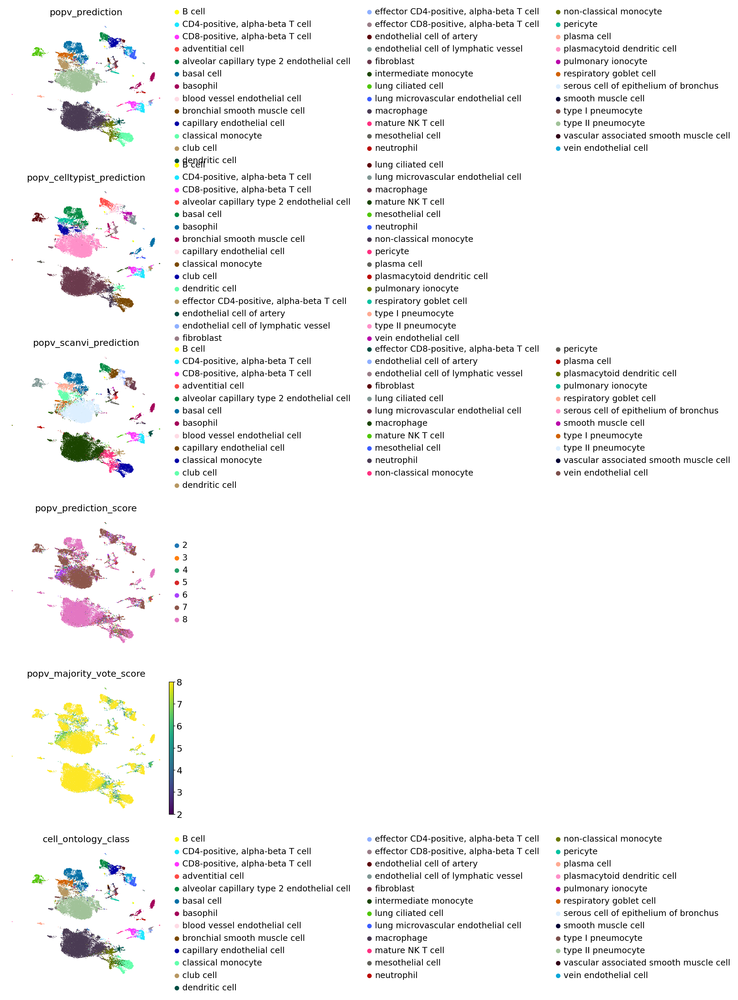

In [12]:
adata.obsm['X_umap'] = adata.obsm['X_scanvi_umap_popv']

sc.pl.umap(adata,
           color=['popv_prediction', 'popv_celltypist_prediction', 'popv_scanvi_prediction', 'popv_prediction_score', 'popv_majority_vote_score', 'cell_ontology_class'], ncols=1)

In [24]:
adata

AnnData object with n_obs × n_vars = 34082 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', '_dataset', 'n_counts', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_prediction', 'popv_onclass_seen', 'popv_onclass_prediction_probabilities', 'popv_onclass_seen_probabilities', 'popv_rf_prediction', 'popv_rf_prediction_probabilities', 'popv_scanvi_prediction', 'p

In [25]:
adata[adata.obs['popv_majority_vote_prediction'] != adata.obs['popv_prediction']].obs[['cell_ontology_class', 'popv_majority_vote_score', 'popv_majority_vote_prediction', 'popv_prediction', 'popv_onclass_prediction', 'popv_onclass_seen']].drop_duplicates()

,cell_ontology_class,popv_majority_vote_score,popv_majority_vote_prediction,popv_prediction,popv_onclass_prediction,popv_onclass_seen
cell_id,,,,,,
TCTGGCTTCGCCACTT_TSP14_Lung_Proximal_10X_1_1,"effector CD8-positive, alpha-beta T cell",4,"effector CD8-positive, alpha-beta T cell","effector CD4-positive, alpha-beta T cell",effector T cell,"effector CD8-positive, alpha-beta T cell"
TTTACTGGTACAAGCG_TSP14_Lung_Proximal_10X_1_1,adventitial cell,4,adventitial cell,fibroblast,supporting cell,adventitial cell
GATGATCGTTCGGACC_TSP14_Lung_Proximal_10X_1_1,"effector CD4-positive, alpha-beta T cell",4,"effector CD4-positive, alpha-beta T cell","CD4-positive, alpha-beta T cell",effector T cell,"effector CD4-positive, alpha-beta T cell"
GATTTCTTCTCGTCAC_TSP14_Lung_Proximal_10X_1_1,smooth muscle cell,4,fibroblast,smooth muscle cell,tracheobronchial smooth muscle cell,smooth muscle cell
GTCGAATGTCAACATC_TSP14_Lung_Distal_10X_1_1,neutrophil,4,lung ciliated cell,neutrophil,immature neutrophil,neutrophil
CAACAGTAGAGGATCC_TSP14_Lung_Distal_10X_1_1,adventitial cell,4,adventitial cell,fibroblast,fibroblast of tunica adventitia of artery,adventitial cell
CCTCAACCACCAATTG_TSP14_Lung_Distal_10X_1_1,mature NK T cell,4,mature NK T cell,"CD8-positive, alpha-beta T cell",mature alpha-beta T cell,mature NK T cell
CAGCGTGTCGAAGGAC_TSP14_Lung_Distal_10X_1_1,blood vessel endothelial cell,4,blood vessel endothelial cell,lung microvascular endothelial cell,microvascular endothelial cell,blood vessel endothelial cell
CTGAATGTCCCATTCG_TSP14_Lung_Proximal_10X_1_1,"effector CD8-positive, alpha-beta T cell",4,"effector CD8-positive, alpha-beta T cell","CD4-positive, alpha-beta T cell",effector T cell,"effector CD8-positive, alpha-beta T cell"


In [26]:
adata

AnnData object with n_obs × n_vars = 34082 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', '_dataset', 'n_counts', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_prediction', 'popv_onclass_seen', 'popv_onclass_prediction_probabilities', 'popv_onclass_seen_probabilities', 'popv_rf_prediction', 'popv_rf_prediction_probabilities', 'popv_scanvi_prediction', 'p

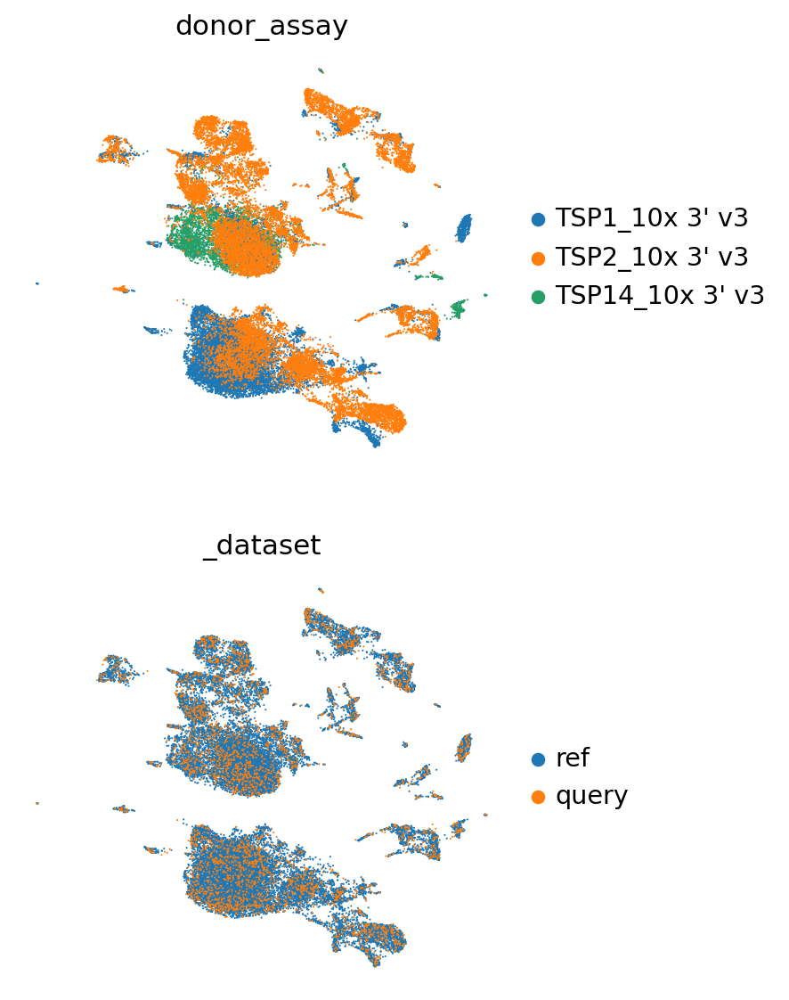

In [27]:
sc.pl.umap(
    adata, color=['donor_assay', '_dataset'], ncols=1)

# Step 6: Summary Statistics

In [28]:
adata

AnnData object with n_obs × n_vars = 34082 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', '_dataset', 'n_counts', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_prediction', 'popv_onclass_seen', 'popv_onclass_prediction_probabilities', 'popv_onclass_seen_probabilities', 'popv_rf_prediction', 'popv_rf_prediction_probabilities', 'popv_scanvi_prediction', 'p

Making confusion matrix for popv_prediction
maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 41 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 46 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'spac

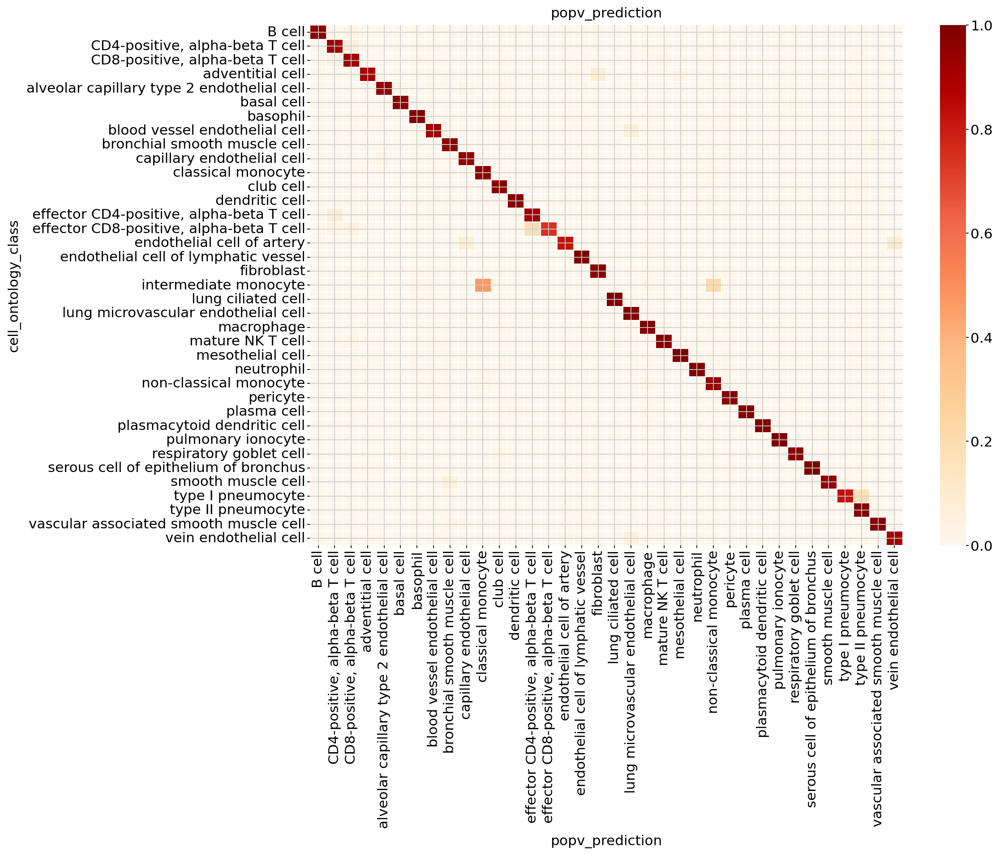

In [29]:
popv.visualization.make_agreement_plots(adata[adata.obs['_dataset']=='ref'], popv_prediction_key='cell_ontology_class', prediction_keys=['popv_prediction'], save_folder=output_folder)

Making confusion matrix for popv_prediction
maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 41 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 46 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'spac

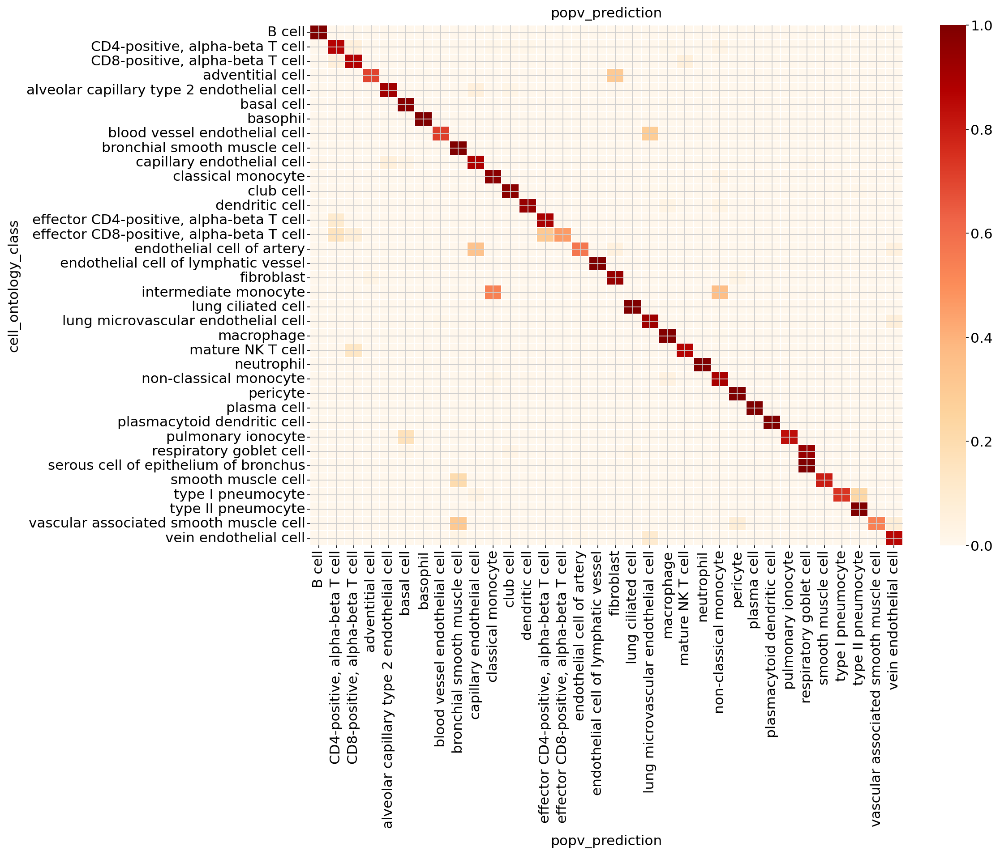

In [30]:
popv.visualization.make_agreement_plots(adata[adata.obs['_dataset']=='query'], popv_prediction_key='cell_ontology_class', prediction_keys=['popv_prediction'], save_folder=output_folder)

In [31]:
os.mkdir('annotation_subsampled/popv_results/')

FileExistsError: [Errno 17] File exists: 'annotation_subsampled/popv_results/'

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 29 glyphs before
Glyph names: ['.notdef', '.null', 'F', 'P', 'S', 'V', 'c', 'd', 'e', 'eight', 'five', 'four', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'q', 'r', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 41, 51, 54, 57, 70, 71, 72, 76, 81, 82, 83, 84, 85, 87, 88, 92]
Closed glyph list over 'GSUB': 29 glyphs after
Glyph names: ['.notdef', '.null', 'F', 'P', 'S', 'V', 'c', 'd', 'e', 'eight', 'five', 'four', 'i', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'q', 'r', 'seven', 'six', 'space', 't', 'three', 'two', 'u', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 19, 20, 21, 22, 23, 24, 25, 26, 27, 41, 51, 54, 57, 70, 71, 72, 76, 81, 82, 83, 84, 85, 87, 88, 92]
Closing glyph list over 'MATH': 29 glyphs before
Glyph names: ['.notd

<Axes: title={'center': 'PopV Prediction Score'}, xlabel='Score', ylabel='Frequency'>

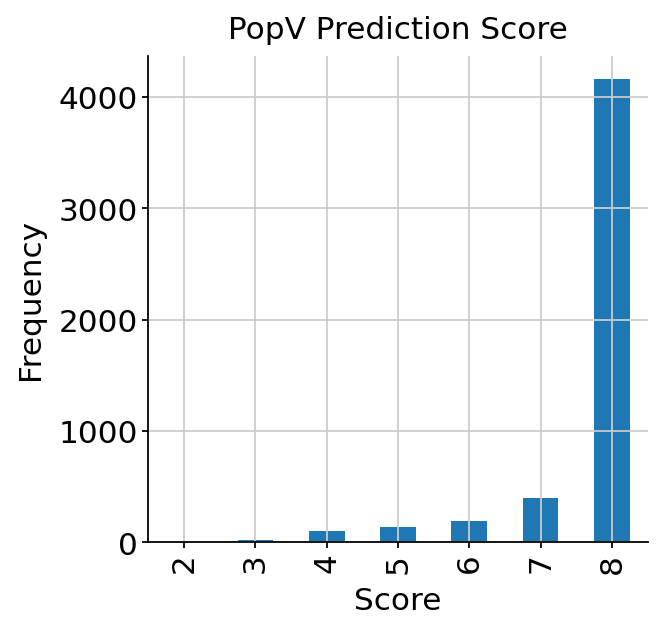

In [13]:
popv.visualization.prediction_score_bar_plot(adata[adata.obs['_dataset']=='query'], popv_prediction_score="popv_majority_vote_score", save_folder=f'{output_folder}/popv_results/')

<Axes: title={'center': 'PopV Prediction Score'}, xlabel='Score', ylabel='Frequency'>

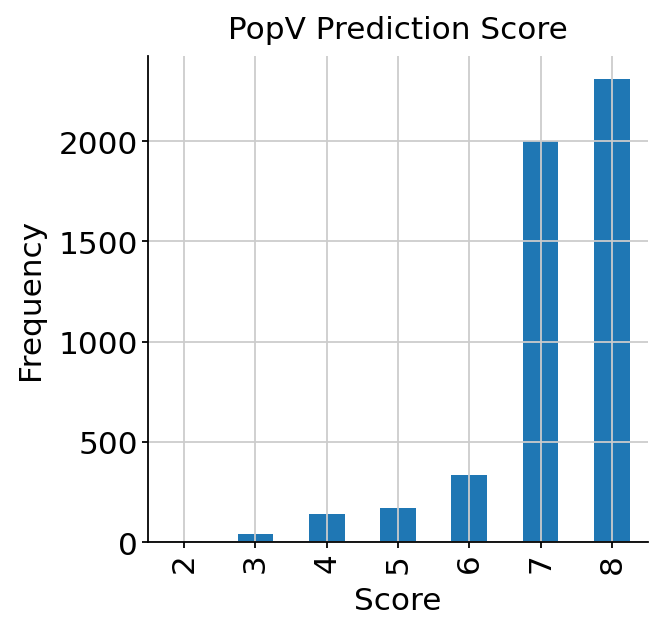

In [34]:
popv.visualization.prediction_score_bar_plot(adata[adata.obs['_dataset']=='query'], popv_prediction_score="popv_prediction_score")

# Step 6: Summary Statistics

In [14]:
adata.obs['harmonized_celltype'] = adata.obs['cell_ontology_class']

In [18]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

# Disable grid lines globally
plt.rcParams["axes.grid"] = False

def _prediction_eval(
    df,
    pred_name,
    label_name,
    name,
    x_label="",
    y_label="",
    save_fig=None,
):
    pred = df[pred_name]
    labels = df[label_name]
    """Generate confusion matrix."""
    types, _ = np.unique(np.concatenate([labels, pred]), return_inverse=True)
    mtx = confusion_matrix(labels, pred, normalize="true")
    df = pd.DataFrame(mtx, columns=types, index=types)
    df = df.loc[np.unique(labels), np.unique(pred)]
    df = df.rename_axis(x_label, axis="columns")
    df = df.rename_axis(y_label)
    df = df[pred.value_counts().index[pred.value_counts()>10]]
    df = df.loc[labels.value_counts().index[labels.value_counts()>1]]
    positions = [df.columns.get_loc(index) for index in df.idxmax(axis=1)]
    df = df.loc[df.index[np.argsort(positions)]]
    
    fig, ax = plt.subplots(figsize=[15, 15])
    sns.heatmap(df.T, linewidths=0.005, cmap="OrRd", square=True)
    plt.tight_layout()
    plt.title(name)
    if not x_label:
        x_label = pred_name
    if not y_label:
        y_label = label_name
    plt.ylabel(pred_name)
    plt.xlabel(label_name)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

    if save_fig:
        plt.savefig(save_fig)
    plt.show()

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 42 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92]
Closed glyph list over 'GSUB': 47 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'undersco

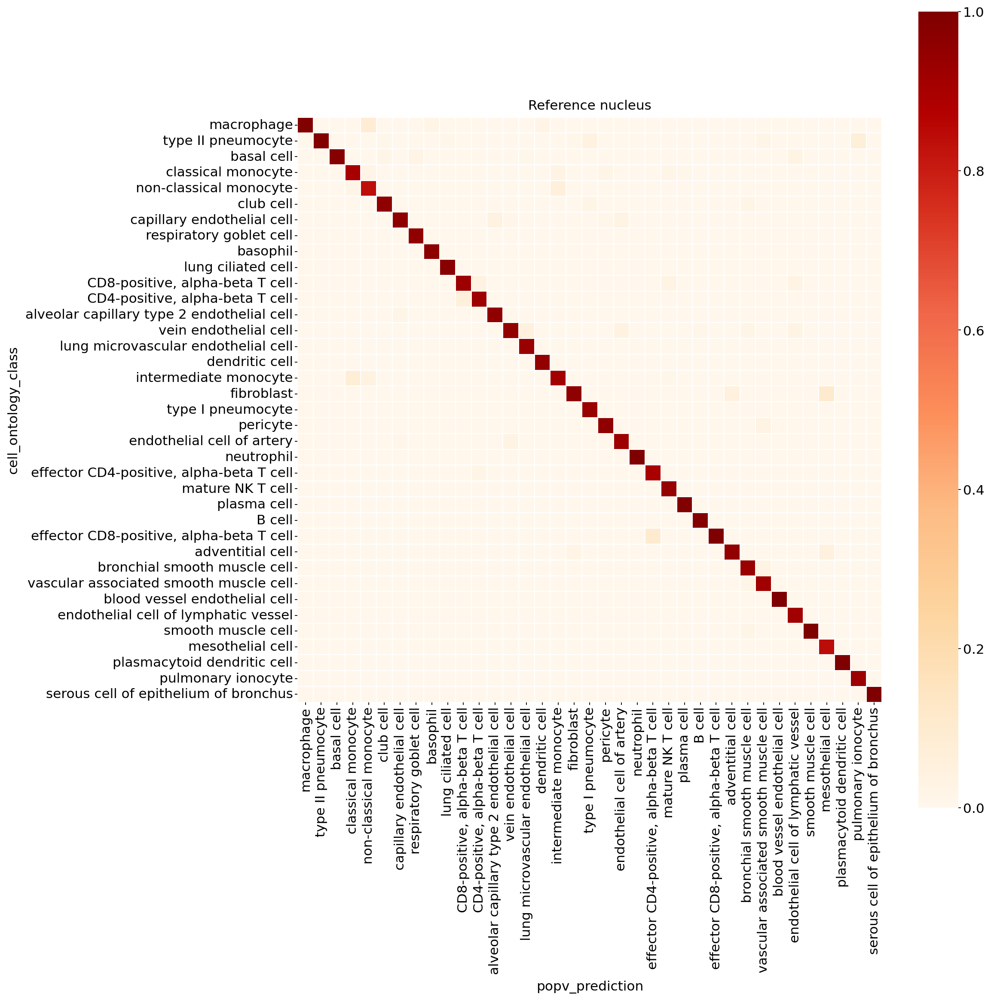

In [19]:
_prediction_eval(adata[adata.obs['_dataset']=='ref'].obs, name='Reference nucleus', pred_name='cell_ontology_class', label_name='popv_prediction', save_fig=f'{output_folder}/popv_agreement_subsample_ref.pdf')

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 

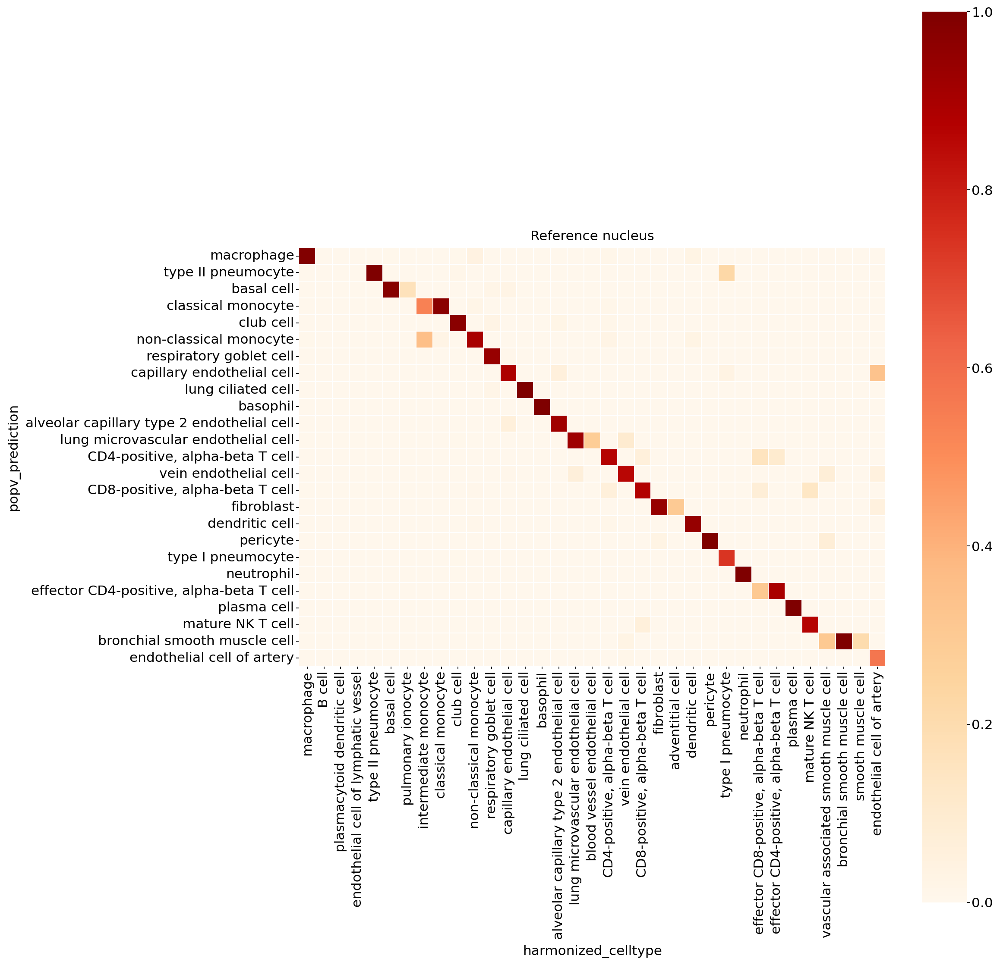

In [20]:
_prediction_eval(adata[adata.obs['_dataset']=='query'].obs, name='Reference nucleus', pred_name='popv_prediction', label_name='harmonized_celltype', save_fig=f'{output_folder}/popv_agreement_dropseq_query.pdf')

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 

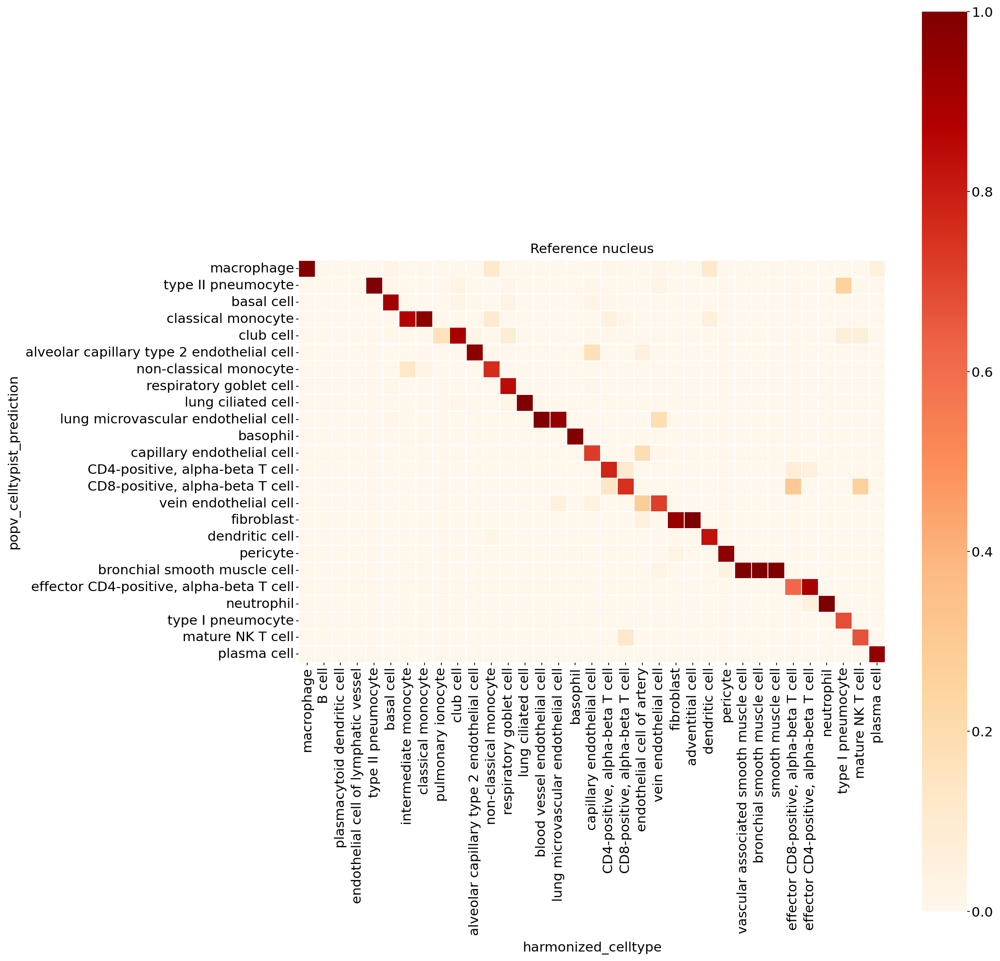

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 44 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 49 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't'

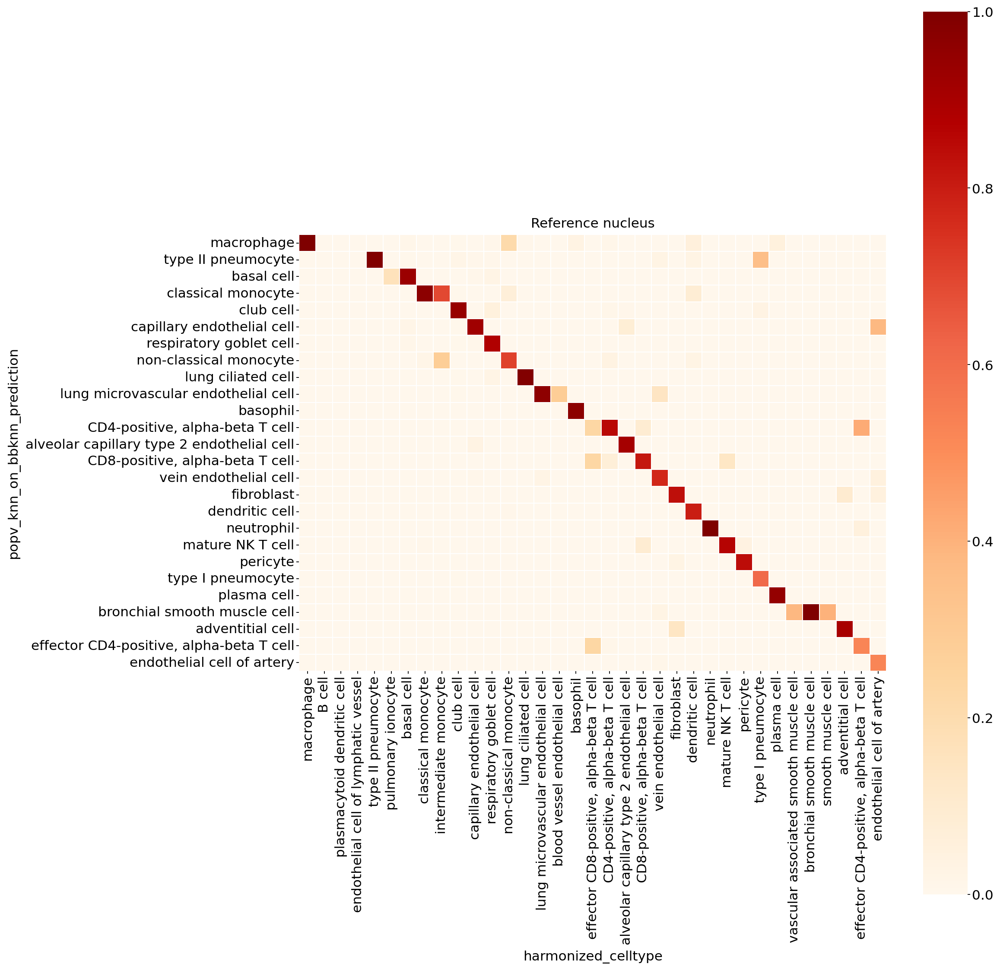

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 44 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 49 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't'

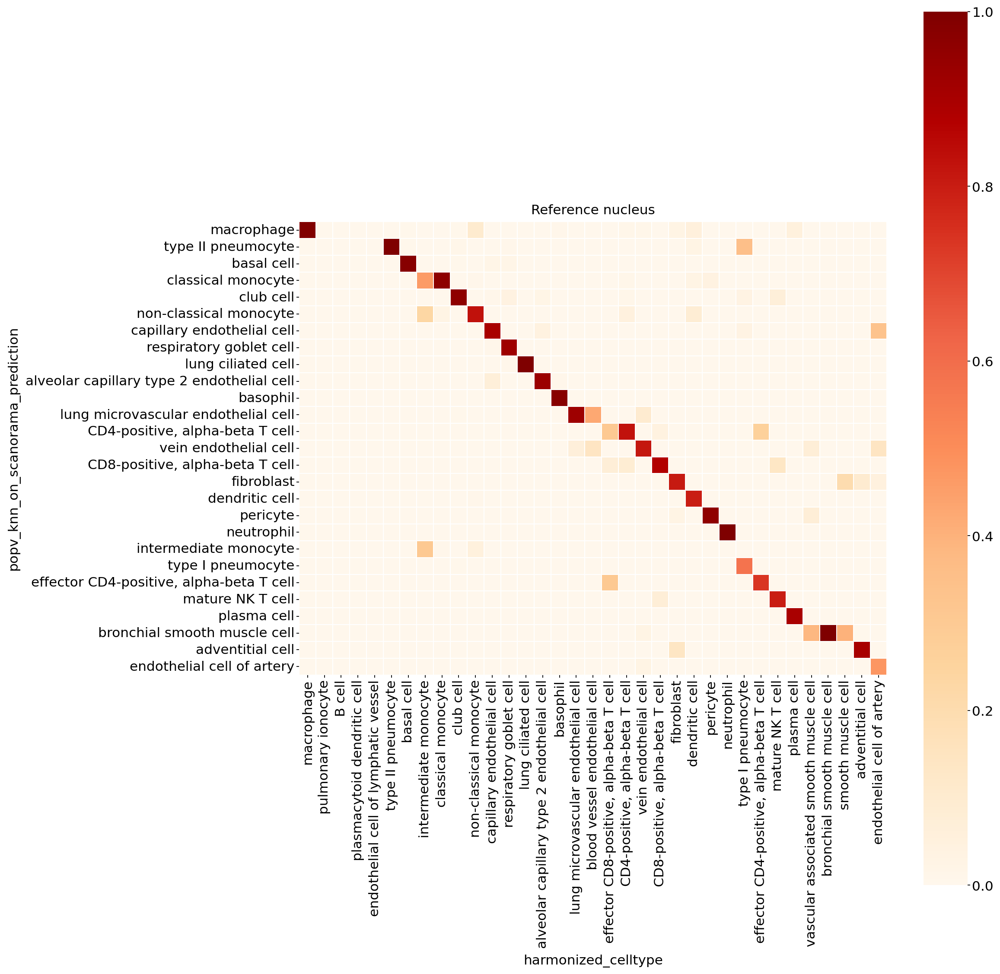

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 44 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 49 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'k', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't'

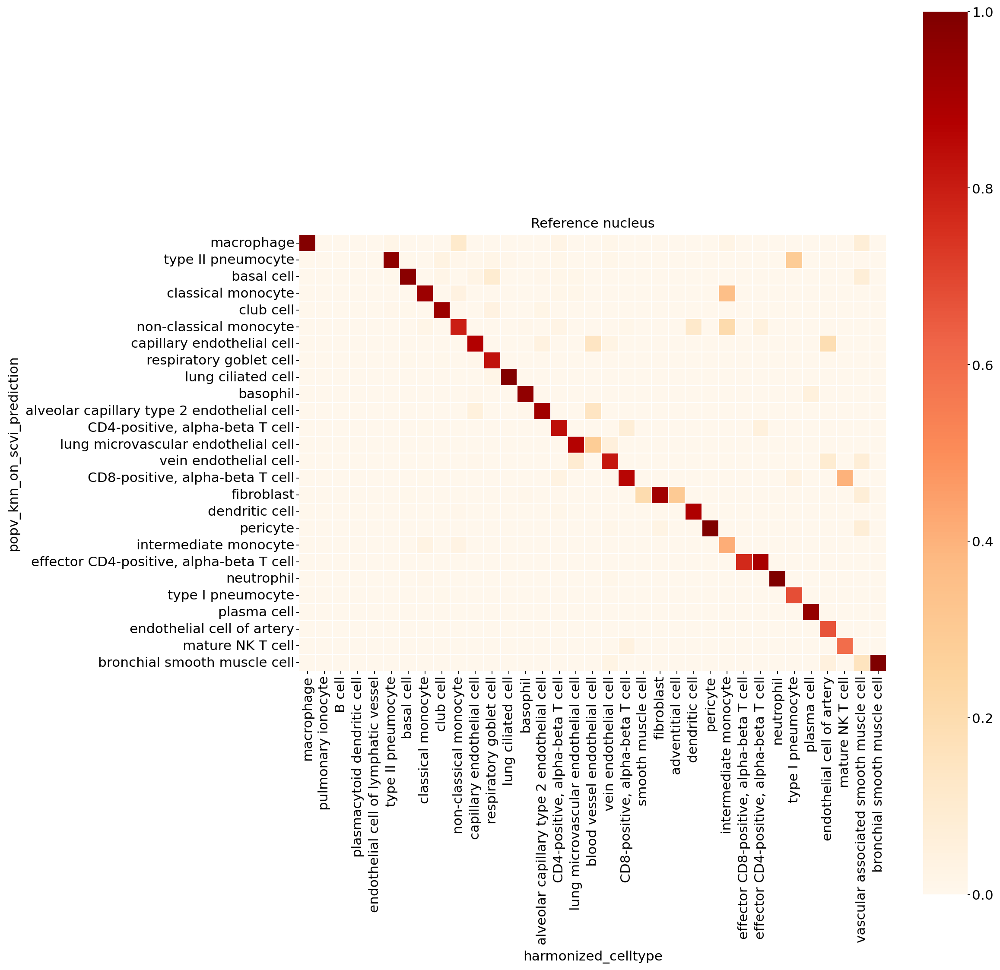

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 47 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'G', 'I', 'K', 'N', 'R', 'T', 'X', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'three', 'two', 'u', 'underscore', 'v', 'w', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 22, 23, 25, 27, 37, 38, 39, 42, 44, 46, 49, 53, 55, 59, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 92, 93]
Closed glyph list over 'GSUB': 52 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'G', 'I', 'K', 'N', 'R', 'T', 'X', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'pe

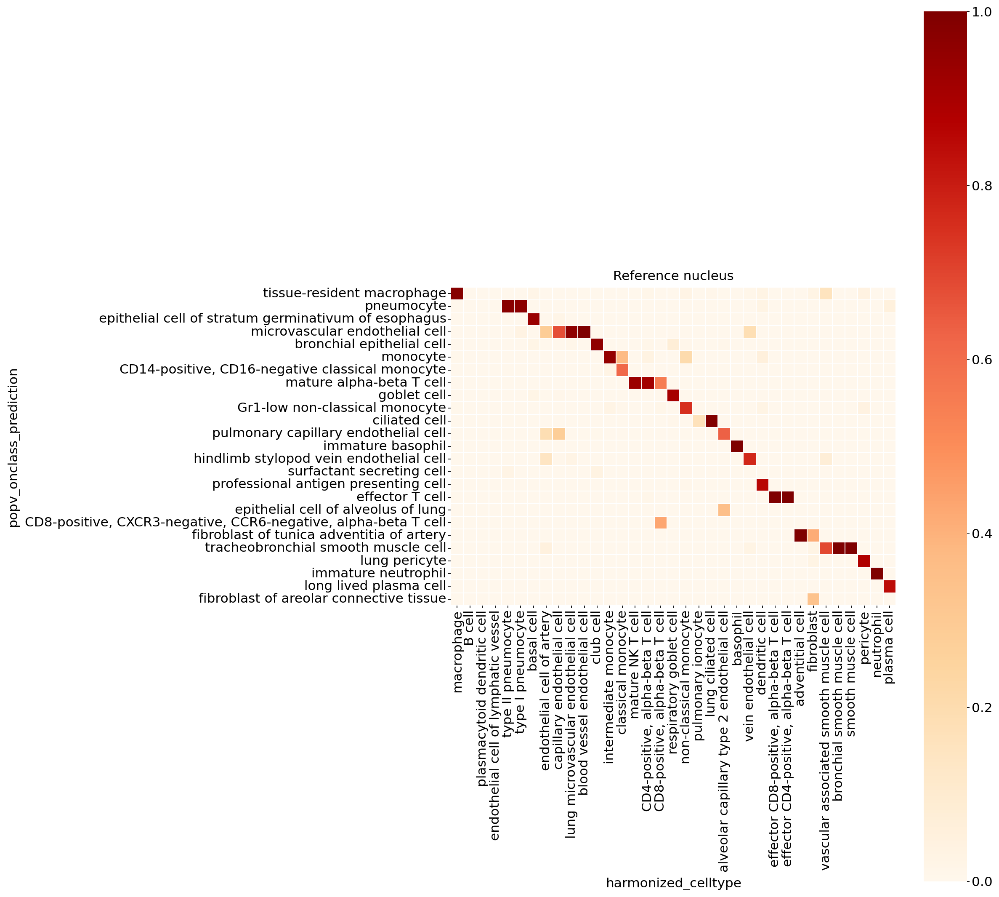

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 

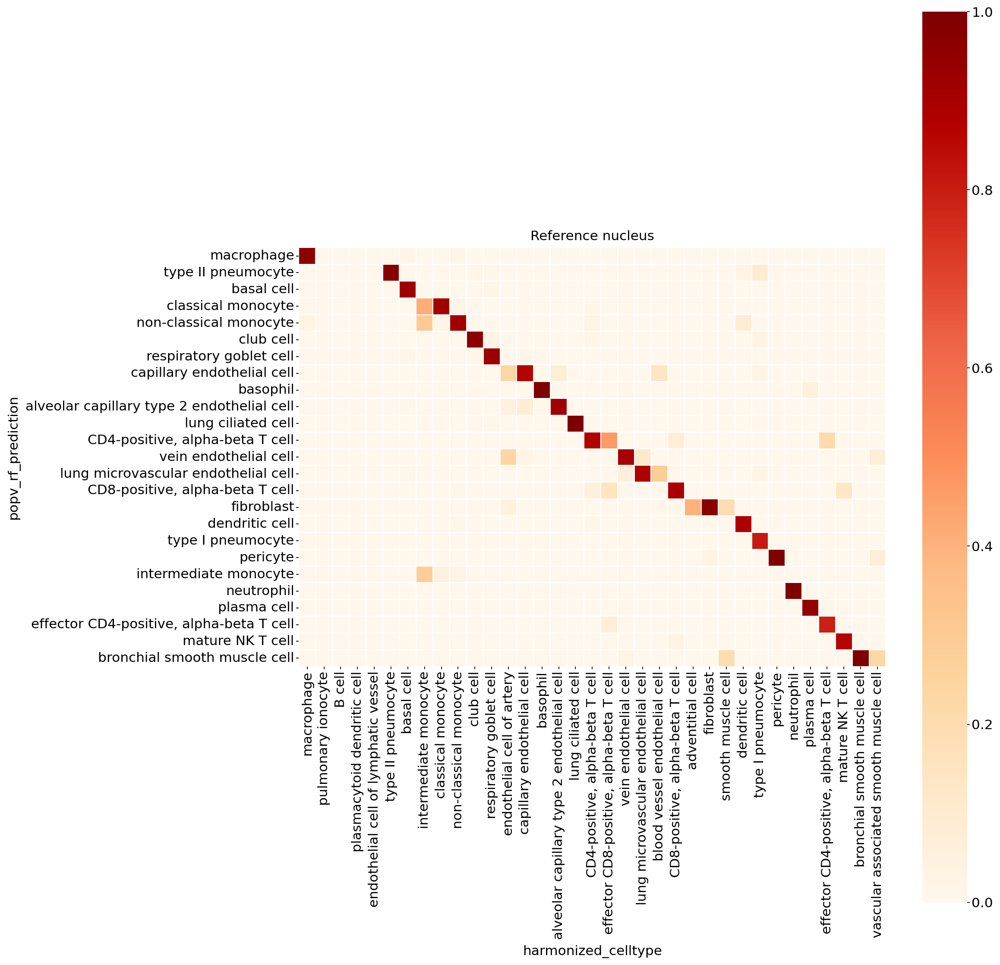

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 

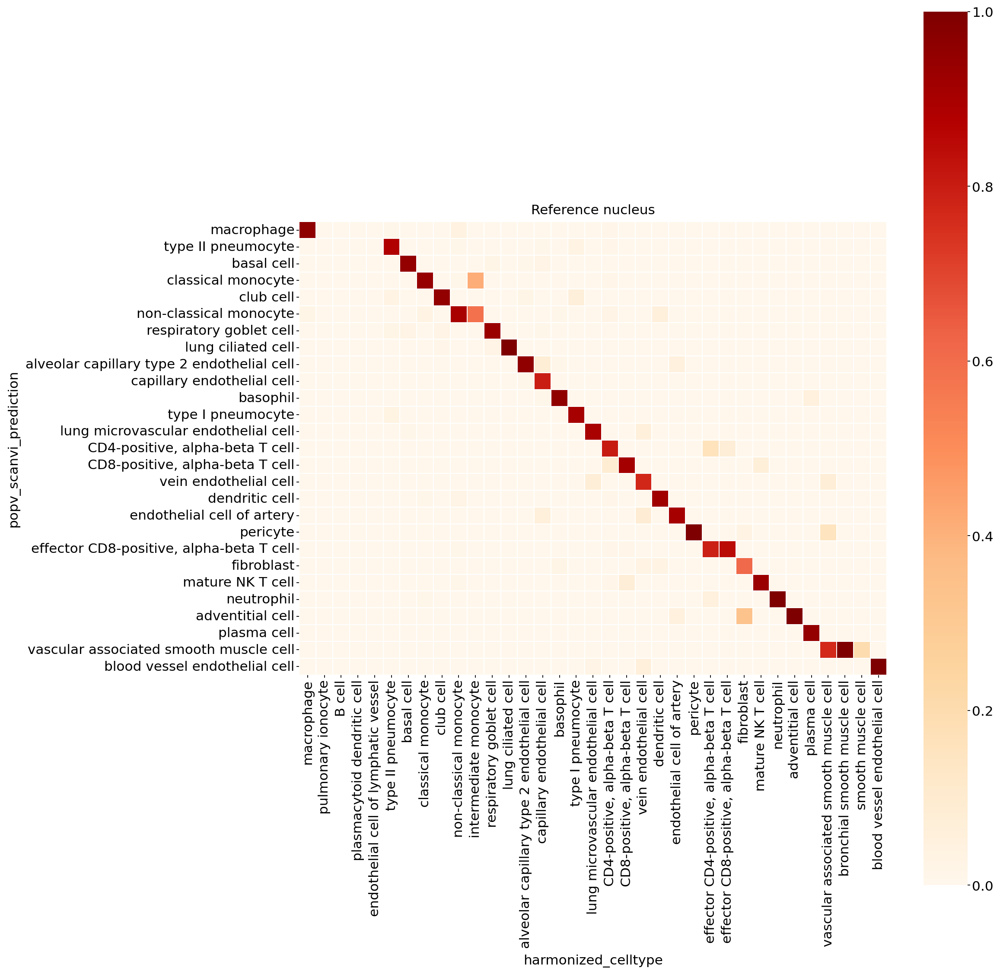

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 

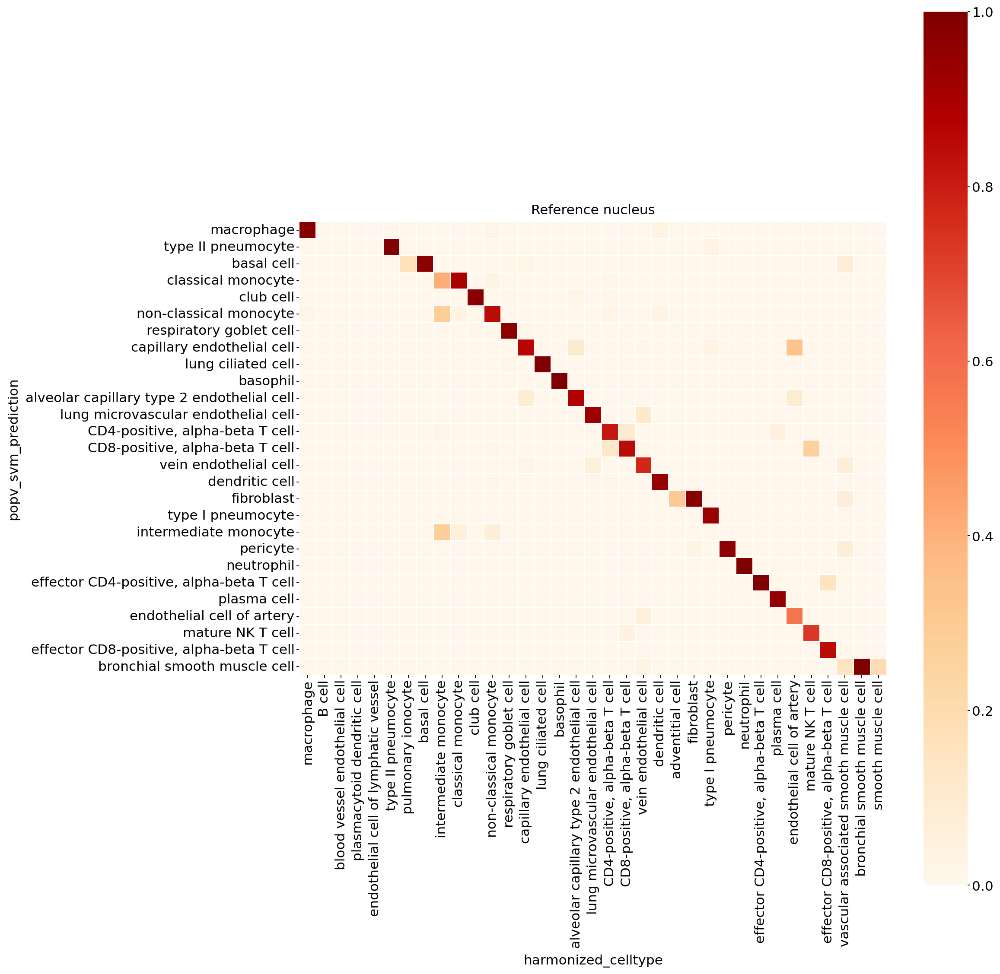

maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 

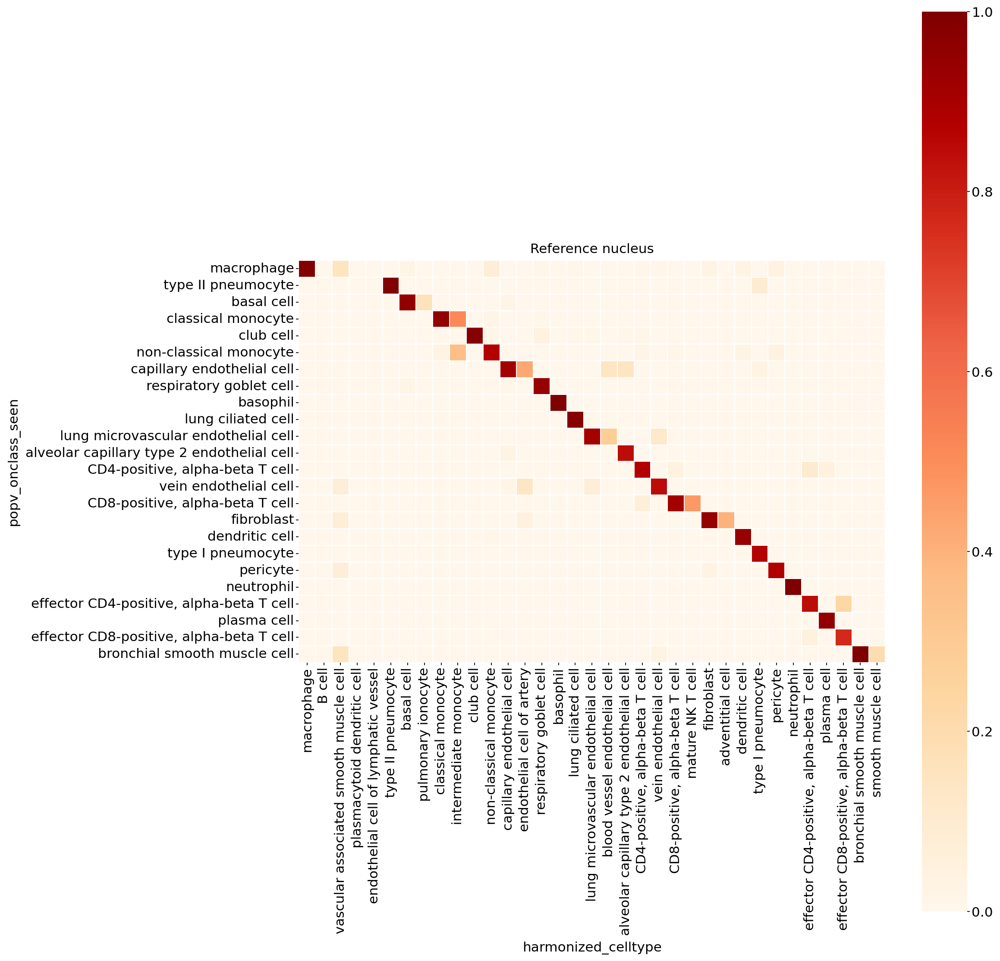

In [21]:
for pred in list(adata.uns['prediction_keys']) + ['popv_onclass_seen']:
    _prediction_eval(adata[adata.obs['_dataset']=='query'].obs, name='Reference nucleus', pred_name=pred, label_name='harmonized_celltype', save_fig=f'{output_folder}/{pred}_agreement_dropseq_query.pdf')

<Axes: title={'center': 'PopV Prediction Score'}, xlabel='Score', ylabel='Frequency'>

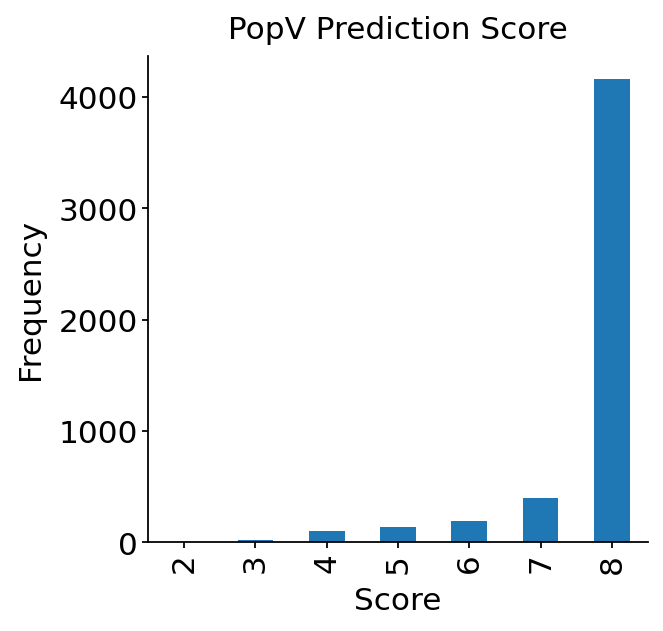

In [22]:
popv.visualization.prediction_score_bar_plot(adata, popv_prediction_score="popv_majority_vote_score")

<Axes: title={'center': 'PopV Prediction Score'}, xlabel='Score', ylabel='Frequency'>

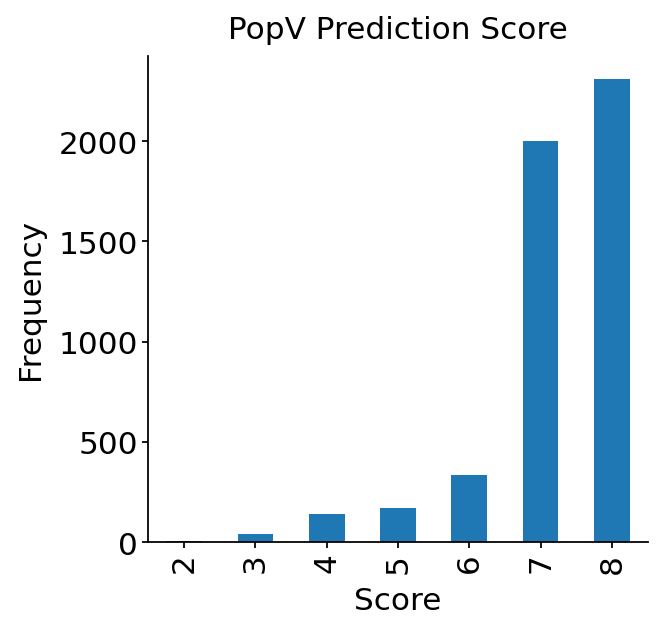

In [23]:
popv.visualization.prediction_score_bar_plot(adata, popv_prediction_score="popv_prediction_score")

In [24]:
from popv.reproducibility import _accuracy

In [25]:
obo_fn = '/data/extra_files/galen_dropbox_figures/can_reproducibility/PopV/ontology/cl.obo'

G = popv._utils.make_ontology_dag(obo_fn)
pred_keys = adata.uns['prediction_keys']
query_adata = adata[np.logical_and(adata.obs['_dataset']=='query', adata.obs['harmonized_celltype']!='unclassified')]

_accuracy._ontology_accuracy(
    query_adata, 
    obofile=obo_fn,
    gt_key='harmonized_celltype', 
    pred_key='popv_prediction',
    save_key='consensus_ontology_accuracy')
for k in pred_keys:
    print(k)
    _accuracy._ontology_accuracy(
        query_adata,
        obofile=obo_fn,
        gt_key='harmonized_celltype', 
        pred_key=k,
        save_key=f'{k}_ontology_accuracy')

popv_celltypist_prediction
popv_knn_on_bbknn_prediction
popv_knn_on_scanorama_prediction
popv_knn_on_scvi_prediction
popv_onclass_prediction
popv_rf_prediction
popv_scanvi_prediction
popv_svm_prediction


In [26]:
query_adata.obs

,tissue_in_publication,donor_id,free_annotation,compartment,cell_type_ontology_term_id,cell_type,assay,sex,tissue,cell_ontology_class,cell_ontology_class_tissue,donor_tissue,assay_correct,donor_assay,_batch_annotation,_labels_annotation,_ref_subsample,_dataset,n_counts,popv_celltypist_prediction,popv_celltypist_prediction_probabilities,popv_knn_on_bbknn_prediction,popv_knn_on_bbknn_prediction_probabilities,popv_knn_on_scanorama_prediction,popv_knn_on_scanorama_prediction_probabilities,subsampled_labels,_scvi_batch,_scvi_labels,popv_knn_on_scvi_prediction,popv_knn_on_scvi_prediction_probabilities,_labels_annotation_cell_ontology_id,popv_onclass_prediction,popv_onclass_seen,popv_onclass_prediction_probabilities,popv_onclass_seen_probabilities,popv_rf_prediction,popv_rf_prediction_probabilities,popv_scanvi_prediction,popv_scanvi_prediction_probabilities,popv_svm_prediction,popv_svm_prediction_probabilities,popv_majority_vote_prediction,popv_majority_vote_score,popv_prediction,popv_prediction_score,popv_prediction_depth,popv_prediction_onclass_relative_depth,popv_parent,harmonized_celltype,consensus_ontology_accuracy,popv_celltypist_prediction_ontology_accuracy,popv_knn_on_bbknn_prediction_ontology_accuracy,popv_knn_on_scanorama_prediction_ontology_accuracy,popv_knn_on_scvi_prediction_ontology_accuracy,popv_onclass_prediction_ontology_accuracy,popv_rf_prediction_ontology_accuracy,popv_scanvi_prediction_ontology_accuracy,popv_svm_prediction_ontology_accuracy
cell_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
TGCAGTATCGAGAAAT_TSP14_Lung_Proximal_10X_1_1,Lung,TSP14,type ii pneumocyte,epithelial,CL:0002063,type II pneumocyte,10x 3' v3,male,lung,type II pneumocyte,Lung_type II pneumocyte,TSP14_Lung,10x 3' v3,TSP14_10x 3' v3,TSP14_10x 3' v3_query,unknown,False,query,24807.0,type II pneumocyte,1.000000,type II pneumocyte,1.000000,type II pneumocyte,1.000000,unknown,1,37,type II pneumocyte,1.000000,unknown,pneumocyte,type II pneumocyte,0.234207,0.994805,type II pneumocyte,0.98,type II pneumocyte,0.999885,type II pneumocyte,0.953312,type II pneumocyte,8,type II pneumocyte,7,5,3,pneumocyte,type II pneumocyte,exact,exact,exact,exact,exact,parent,exact,exact,exact
TAGATCGGTGTCTTCC_TSP14_Lung_Distal_10X_1_1,Lung,TSP14,type ii pneumocyte,epithelial,CL:0002063,type II pneumocyte,10x 3' v3,male,lung,type II pneumocyte,Lung_type II pneumocyte,TSP14_Lung,10x 3' v3,TSP14_10x 3' v3,TSP14_10x 3' v3_query,unknown,False,query,40336.0,type II pneumocyte,0.999967,type II pneumocyte,1.000000,type II pneumocyte,1.000000,unknown,1,37,type II pneumocyte,0.800000,unknown,pneumocyte,type II pneumocyte,0.232966,0.988892,type II pneumocyte,0.96,type II pneumocyte,0.999879,type II pneumocyte,0.967139,type II pneumocyte,8,type II pneumocyte,7,5,3,pneumocyte,type II pneumocyte,exact,exact,exact,exact,exact,parent,exact,exact,exact
ATCGTGAAGCAACAAT_TSP14_Lung_Distal_10X_1_1,Lung,TSP14,type ii pneumocyte,epithelial,CL:0002063,type II pneumocyte,10x 3' v3,male,lung,type II pneumocyte,Lung_type II pneumocyte,TSP14_Lung,10x 3' v3,TSP14_10x 3' v3,TSP14_10x 3' v3_query,unknown,False,query,20631.0,type II pneumocyte,0.997676,type II pneumocyte,0.600000,type II pneumocyte,1.000000,unknown,1,37,type II pneumocyte,1.000000,unknown,pneumocyte,type II pneumocyte,0.225650,0.924308,type II pneumocyte,0.80,plasma cell,0.987582,type II pneumocyte,0.938198,type II pneumocyte,7,type II pneumocyte,6,5,3,pneumocyte,type II pneumocyte,exact,exact,exact,exact,exact,parent,exact,no match,exact
CATTCATTCGTGGGAA_TSP14_Lung_NA_10X_2_1,Lung,TSP14,type ii pneumocyte,epithelial,CL:0002063,type II pneumocyte,10x 3' v3,male,lung,type II pneumocyte,Lung_type II pneumocyte,TSP14_Lung,10x 3' v3,TSP14_10x 3' v3,TSP14_10x 3' v3_query,unknown,False,query,45359.0,type II pneumocyte,0.999997,type II pneumocyte,1.000000,type II pneumocyte,1.000000,unknown,1,37,type II pneumocyte,0.933333,unknown,pneumocyte,type II pneumocyte,0.234130,0.993799,type II pneumocyte,0.96,type II pneumocyte,0.9999

In [27]:
accuracy_replace_dict = {'exact': 'Exact Match', 
                         'parent': 'Parent Match',
                         'child': "Child Match",
                         'sibling': 'Sibling Match',
                         'no match': 'No Match'
                        }

ontology_vote_cols = [s for s in query_adata.obs.keys() if s.endswith('ontology_accuracy')]

cat_order = [
    "Exact Match",
    "Parent Match",
    "Child Match",
    "Sibling Match",
    "No Match",
]

for s in ontology_vote_cols:
    print(s)
    query_adata.obs[f'{s}_annotated'] = query_adata.obs[s].replace(accuracy_replace_dict)
    query_adata.obs[f'{s}_annotated'] = query_adata.obs[f'{s}_annotated'].astype('category')
    query_adata.obs[f'{s}_annotated'] = query_adata.obs[f'{s}_annotated'].cat.add_categories(set(cat_order)-set(query_adata.obs[f'{s}_annotated'].cat.categories))
    query_adata.obs[f'{s}_annotated'] = query_adata.obs[f'{s}_annotated'].values.reorder_categories(cat_order)

consensus_ontology_accuracy
popv_celltypist_prediction_ontology_accuracy
popv_knn_on_bbknn_prediction_ontology_accuracy
popv_knn_on_scanorama_prediction_ontology_accuracy
popv_knn_on_scvi_prediction_ontology_accuracy
popv_onclass_prediction_ontology_accuracy
popv_rf_prediction_ontology_accuracy
popv_scanvi_prediction_ontology_accuracy
popv_svm_prediction_ontology_accuracy


In [28]:
acc_annotated_cols = [s for s in query_adata.obs.keys() if s.endswith('_annotated')]

In [29]:
df = query_adata.obs[acc_annotated_cols].apply(pd.Series.value_counts)


In [30]:
df = df.T

In [31]:
df = df / df.sum(1)[0]

In [32]:
df = df.sort_values('Exact Match', ascending=False)

In [33]:
[s.split('_')[:-3] for s in df.index]

[['consensus'],
 ['popv', 'knn', 'on', 'scanorama', 'prediction'],
 ['popv', 'svm', 'prediction'],
 ['popv', 'knn', 'on', 'bbknn', 'prediction'],
 ['popv', 'rf', 'prediction'],
 ['popv', 'knn', 'on', 'scvi', 'prediction'],
 ['popv', 'celltypist', 'prediction'],
 ['popv', 'scanvi', 'prediction'],
 ['popv', 'onclass', 'prediction']]

In [34]:
df.index = ['_'.join([i for i in s.split('_')[:-3] if i!='prediction']) for s in df.index]

In [35]:
rename_dict = {
    'consensus': 'PopV',
    'popv_celltypist': 'Celltypist',
    'popv_knn_on_scanorama': 'Scanorama + KNN',
    'popv_knn_on_scvi': 'scVI + KNN',
    'popv_scanvi': 'scANVI',
    'popv_knn_on_bbknn': 'BBKNN + KNN',
    'popv_rf': 'Random Forest',
    'seurat': 'Seurat',
    'popv_onclass': 'OnClass',
    'popv_onclass_seen': 'OnClass_seen',
    'popv_svm': 'SVM'}

In [36]:
df = df.rename(index=rename_dict)

In [37]:
df

,Exact Match,Parent Match,Child Match,Sibling Match,No Match
PopV,0.9624,0.0006,0.0000,0.0168,0.0202
Scanorama + KNN,0.9560,0.0014,0.0002,0.0184,0.0240
SVM,0.9510,0.0000,0.0000,0.0218,0.0272
BBKNN + KNN,0.9448,0.0028,0.0006,0.0202,0.0316
Random Forest,0.9412,0.0012,0.0000,0.0194,0.0382
scVI + KNN,0.9374,0.0006,0.0006,0.0218,0.0396
Celltypist,0.9330,0.0010,0.0000,0.0264,0.0396
scANVI,0.9086,0.0014,0.0004,0.0386,0.0510
OnClass,0.0000,0.4620,0.5100,0.0076,0.0204


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 45 glyphs before
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'I', 'K', 'M', 'N', 'O', 'P', 'R', 'S', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'six', 'space', 't', 'two', 'u', 'x', 'y', 'zero']
Glyph IDs:   [0, 1, 2, 3, 14, 17, 19, 20, 21, 23, 25, 27, 36, 37, 38, 40, 41, 44, 46, 48, 49, 50, 51, 53, 54, 57, 68, 69, 70, 71, 72, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 91, 92]
Closed glyph list over 'GSUB': 45 glyphs after
Glyph names: ['.notdef', '.null', 'A', 'B', 'C', 'E', 'F', 'I', 'K', 'M', 'N', 'O', 'P', 'R', 'S', 'V', 'a', 'b', 'c', 'd', 'e', 'eight', 'four', 'g', 'h', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'plus', 'r', 's', 'six', 'space', 't', 'two', 

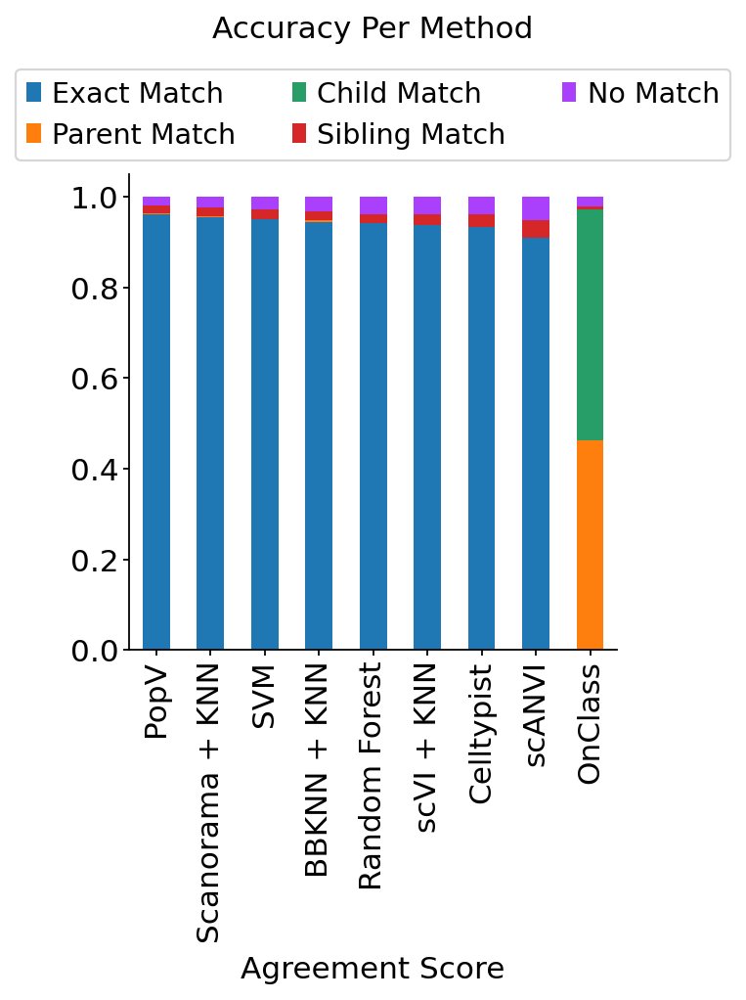

In [38]:
ax = df.plot.bar(stacked=True)

ax.set_xlabel('Agreement Score')
ax.set_title('Accuracy Per Method', y=1.25)

ax.legend(loc='upper center', bbox_to_anchor=(0.5, 1.25),ncol=3)
plt.savefig(f'{output_folder}/popv_accuracy_per_method.pdf', bbox_inches='tight')


maxp pruned
cmap pruned
kern dropped
post pruned
FFTM dropped
GPOS pruned
GSUB pruned
glyf pruned
Added gid0 to subset
Added first four glyphs to subset
Closing glyph list over 'GSUB': 43 glyphs before
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 'underscore', 'v', 'y', 'z', 'zero']
Glyph IDs:   [0, 1, 2, 3, 15, 16, 17, 19, 20, 21, 23, 25, 27, 37, 38, 39, 44, 46, 49, 53, 55, 66, 68, 69, 70, 71, 72, 73, 74, 75, 76, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 92, 93]
Closed glyph list over 'GSUB': 48 glyphs after
Glyph names: ['.notdef', '.null', 'B', 'C', 'D', 'I', 'K', 'N', 'R', 'T', 'a', 'b', 'c', 'comma', 'd', 'e', 'eight', 'f', 'fi', 'fl', 'four', 'g', 'h', 'hyphen', 'i', 'l', 'm', 'n', 'nonmarkingreturn', 'o', 'one', 'p', 'period', 'r', 's', 'six', 'space', 't', 'two', 'u', 

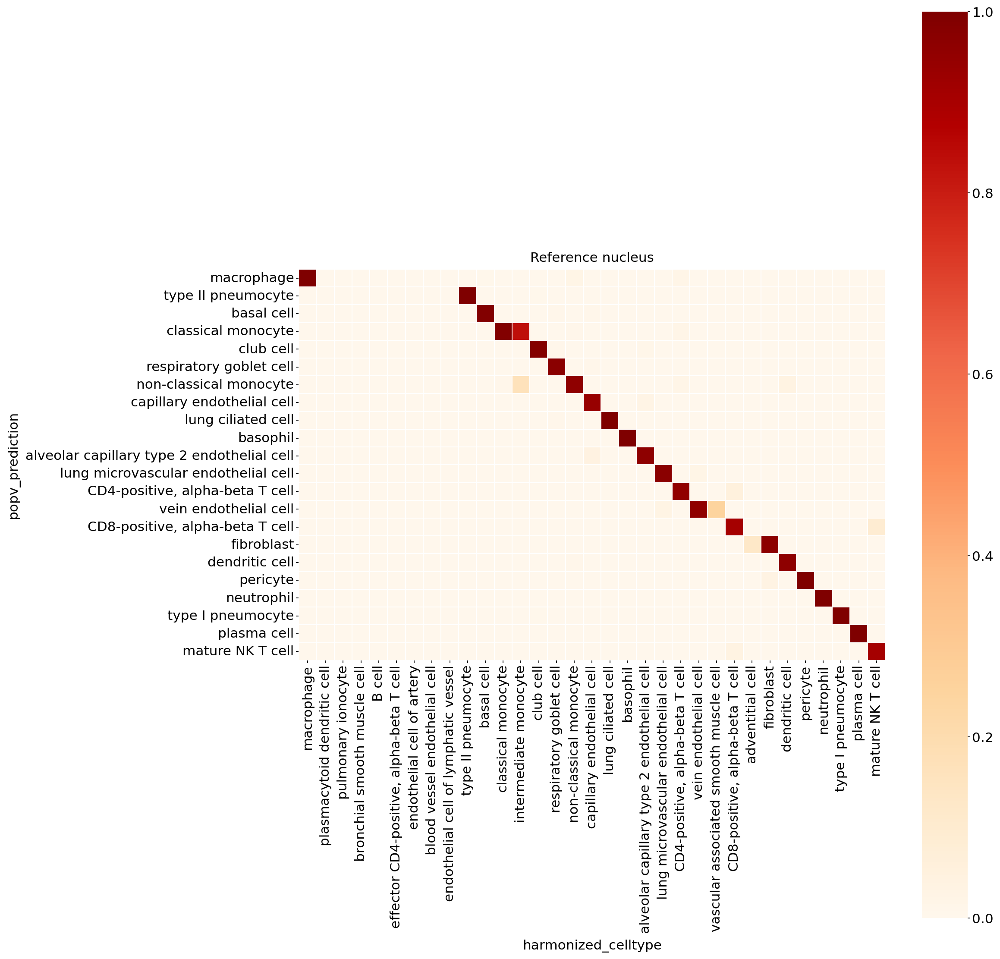

In [39]:
_prediction_eval(query_adata[query_adata.obs['popv_prediction_score'].astype(int)>5].obs, name='Reference nucleus', pred_name='popv_prediction', label_name='harmonized_celltype', save_fig=f'{output_folder}/popv_agreement_nucleus_query_certain.pdf')

In [45]:
query_adata

AnnData object with n_obs × n_vars = 5000 × 4000
    obs: 'tissue_in_publication', 'donor_id', 'free_annotation', 'compartment', 'cell_type_ontology_term_id', 'cell_type', 'assay', 'sex', 'tissue', 'cell_ontology_class', 'cell_ontology_class_tissue', 'donor_tissue', 'assay_correct', 'donor_assay', '_batch_annotation', '_labels_annotation', '_ref_subsample', '_dataset', 'n_counts', 'popv_celltypist_prediction', 'popv_celltypist_prediction_probabilities', 'popv_knn_on_bbknn_prediction', 'popv_knn_on_bbknn_prediction_probabilities', 'popv_knn_on_scanorama_prediction', 'popv_knn_on_scanorama_prediction_probabilities', 'subsampled_labels', '_scvi_batch', '_scvi_labels', 'popv_knn_on_scvi_prediction', 'popv_knn_on_scvi_prediction_probabilities', '_labels_annotation_cell_ontology_id', 'popv_onclass_prediction', 'popv_onclass_seen', 'popv_onclass_prediction_probabilities', 'popv_onclass_seen_probabilities', 'popv_rf_prediction', 'popv_rf_prediction_probabilities', 'popv_scanvi_prediction', 'po

In [46]:
from sklearn.metrics import f1_score

y_true = query_adata.obs['harmonized_celltype']
f1_df = pd.DataFrame(columns = ['macro', "micro", "weighted"])
pred_keys = list(query_adata.uns['prediction_keys']) + ['popv_prediction']

for key in pred_keys:
    y_pred = list(query_adata.obs[key])
    f1_macro = f1_score(y_true, y_pred, average='macro')
    f1_micro = f1_score(y_true, y_pred, average='micro')
    f1_weighted = f1_score(y_true, y_pred, average='weighted')
    f1_df.loc[key] = [f1_macro, f1_micro,f1_weighted]

f1_df.sort_values(by='weighted', ascending=False)

,macro,micro,weighted
popv_prediction,0.842620,0.9624,0.959684
popv_knn_on_scanorama_prediction,0.807101,0.9560,0.953774
popv_svm_prediction,0.852557,0.9510,0.951248
popv_rf_prediction,0.816821,0.9412,0.941780
popv_knn_on_bbknn_prediction,0.801091,0.9448,0.940581
popv_knn_on_scvi_prediction,0.787023,0.9374,0.935689
popv_celltypist_prediction,0.664848,0.9330,0.925785
popv_scanvi_prediction,0.712397,0.9086,0.909343
popv_onclass_prediction,0.000000,0.0000,0.000000


In [50]:
f1_df.to_csv(f'{output_folder}/f1_scores.csv')